# INM433 Visual Analytics: Lab10

<h2>Exploration of customers' reviews</h2>

The exercise is based on a tutorial <i>"EDA and visualization for Text Data"</i> 
downloaded from 
https://towardsdatascience.com/a-complete-exploratory-data-analysis-and-visualization-for-text-data-29fb1b96fb6a

Other links:
https://github.com/susanli2016/NLP-with-Python/blob/master/EDA%20and%20visualization%20for%20Text%20Data.ipynb
https://www.kdnuggets.com/2019/05/complete-exploratory-data-analysis-visualization-text-data.html

Data:

https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews/download

Installation of libraries:

<pre>
conda install -c conda-forge textblob cufflinks-py plotly==2.7.0
python -m textblob.download_corpora
</pre>

The exercise also includes creation of word clouds. The code is based on a tutorial <i>"Generating WordClouds in Python"</i> 
available at https://www.datacamp.com/community/tutorials/wordcloud-python. The tutorial explains the parameters of the word cloud and demonstrates how to adjust them.

Generation of word clouds requires installation of the package wordcloud:

<pre>
conda install -c conda-forge wordcloud
</pre>


In [1]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.feature_extraction.text import TfidfVectorizer
import warnings 
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10.0, 6.0)
import plotly.graph_objs as go
import chart_studio.plotly as py
import cufflinks
pd.options.display.max_columns = 30
from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')
#from sklearn.decomposition import TruncatedSVD
#from sklearn.decomposition import LatentDirichletAllocation
#from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook
output_notebook()
from collections import Counter
#import scattertext as st
#import spacy
#from pprint import pprint
#import en_core_web_sm
##nlp = spacy.load('en_core_web_md')
#nlp = spacy.load('en_core_web_sm')

# --------- Word Cloud ---------------
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


Loading BokehJS ...

Load the data:

In [2]:
df = pd.read_csv('Womens Clothing E-Commerce Reviews.csv')
df.head(10)

,N,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
5,5,1080,49,Not for the very petite,"I love tracy reese dresses, but this one is no...",2,0,4,General,Dresses,Dresses
6,6,858,39,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5,1,1,General Petite,Tops,Knits
7,7,858,39,"Shimmer, surprisingly goes with lots","I ordered this in carbon for store pick up, an...",4,1,4,General Petite,Tops,Knits
8,8,1077,24,Flattering,I love this dress. i usually get an xs but it ...,5,1,0,General,Dresses,Dresses
9,9,1077,34,Such a fun dress!,"I'm 5""5' and 125 lbs. i ordered the s petite t...",5,1,0,General,Dresses,Dresses


Let us look at the texts:

In [3]:
a = 0 
for i in range(a,a+5):
    print(df['Title'][i])
    print(df['Review Text'][i])
    print()

nan
Absolutely wonderful - silky and sexy and comfortable

nan
Love this dress!  it's sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it's petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.

Some major design flaws
I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c

My favorite buy!
I love, love, love this jumpsuit. it's fun, flirty, and fabulous! every time i wear it, i

Removal of special symbols from the text:

In [4]:
df = df[~df['Review Text'].isnull()]
def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace("(<br/>)", "")
    ReviewText = ReviewText.str.replace('(<a).*(>).*(</a>)', '')
    ReviewText = ReviewText.str.replace('(&amp)', '')
    ReviewText = ReviewText.str.replace('(&gt)', '')
    ReviewText = ReviewText.str.replace('(&lt)', '')
    ReviewText = ReviewText.str.replace('(\xa0)', ' ')  
    return ReviewText
df['Review Text'] = preprocess(df['Review Text'])

## Summarising texts in word clouds
Let us now try to create a word cloud from the review texts. 
The meanings of the parameters can be seen in the tutorial at 
https://www.datacamp.com/community/tutorials/wordcloud-python

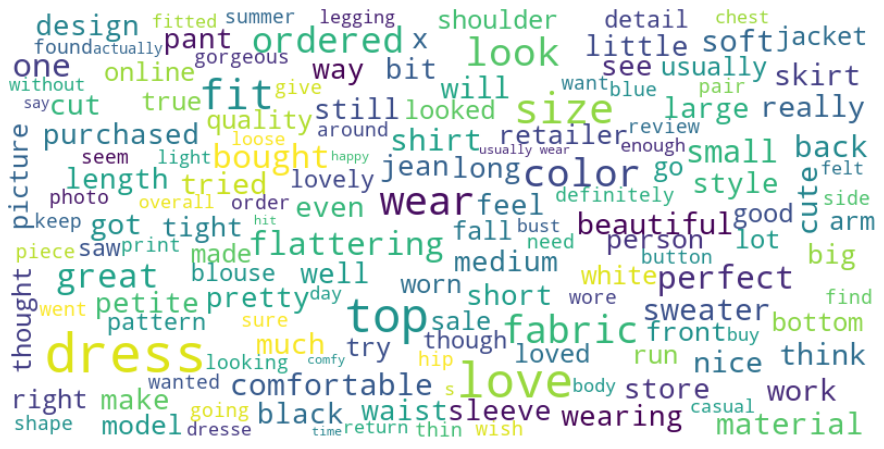

In [5]:
#text = df['Review Text'][0]
# concatenate all reviews in a single large text
text = " ".join(review for review in df['Review Text'])

# the following code can be used if you wish to make a word cloud  from the titles of the reviews
# df1 = df[~df['Title'].isnull()]
# text = " ".join(review for review in df1['Title'])

# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=400, prefer_horizontal=0.99).generate(text)

#The following code can be used for exporting the word cloud image to a file:
#wordcloud.to_file("cloud.png")

# Display the generated image:
_ = plt.figure(figsize = (16, 8))
_ = plt.imshow(wordcloud, interpolation='bilinear')
_ = plt.axis("off")
plt.show()

### Comparison of positive and negative reviews
Let us create and compare word clouds from the positive and negative reviews, i.e., the reviews with the rating >3 and <3, respectively.

Negative reviews


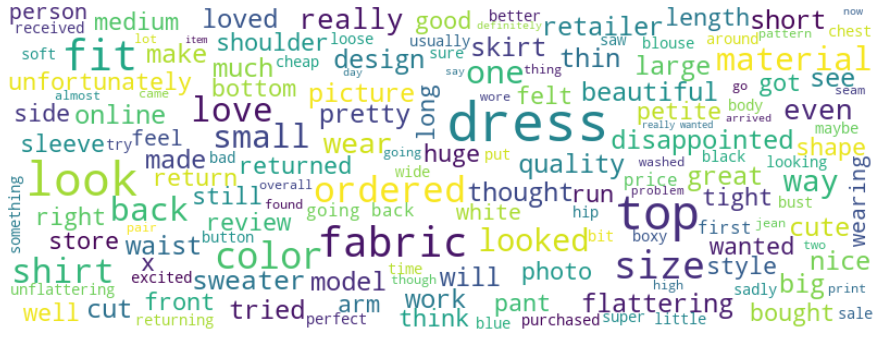

Positive reviews


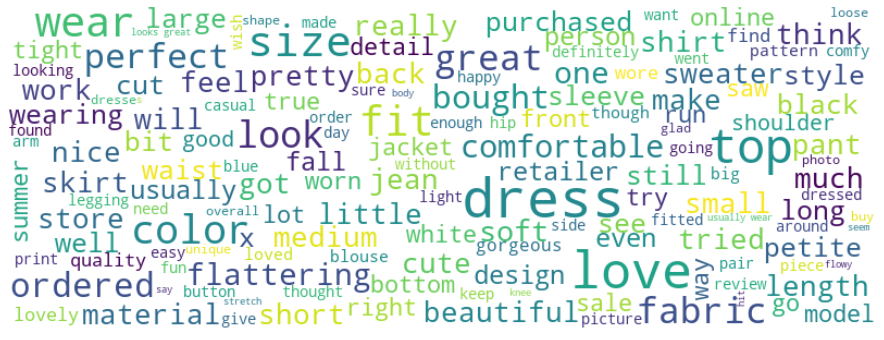

In [6]:
df_selection=df[df['Rating']<3]
text = " ".join(review for review in df_selection['Review Text']) 

wordcloud1 = WordCloud(max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

df_selection=df[df['Rating']>3]
text = " ".join(review for review in df_selection['Review Text']) 

wordcloud2 = WordCloud(max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud1, interpolation='bilinear')
_ = plt.axis("off")
print("Negative reviews")
plt.show()

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud2, interpolation='bilinear')
_ = plt.axis("off")
print("Positive reviews")
plt.show()


We see that the negative reviews nevertheless include positive words like "beautiful" and "pretty", which also frequently occur in the positive reviews, but there are also quite a few negative words that are not frequent in the positive reviews: "unfortunately" and "disappointed". Some words indicate that the customers returned their purchases back.

### Now we shall obtain the sentiment polarity values for the texts:

In [7]:
df['polarity'] = df['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)
df.head(10)

,N,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,polarity
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,0.339583
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,0.073675
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,0.550000
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,0.512891
5,5,1080,49,Not for the very petite,"I love tracy reese dresses, but this one is no...",2,0,4,General,Dresses,Dresses,0.178750
6,6,858,39,Cagrcoal shimmer fun,I aded this in my basket at hte last mintue to...,5,1,1,General Petite,Tops,Knits,0.133750
7,7,858,39,"Shimmer, surprisingly goes with lots","I ordered this in carbon for store pick up, an...",4,1,4,General Petite,Tops,Knits,0.171635
8,8,1077,24,Flattering,I love this dress. i usually get an xs but it ...,5,1,0,General,Dresses,Dresses,0.002500
9,9,1077,34,Such a fun dress!,"I'm 5""5' and 125 lbs. i ordered the s petite t...",5,1,0,General,Dresses,Dresses,0.204200


Look at the distribution of the computed values of the sentiment polarity:

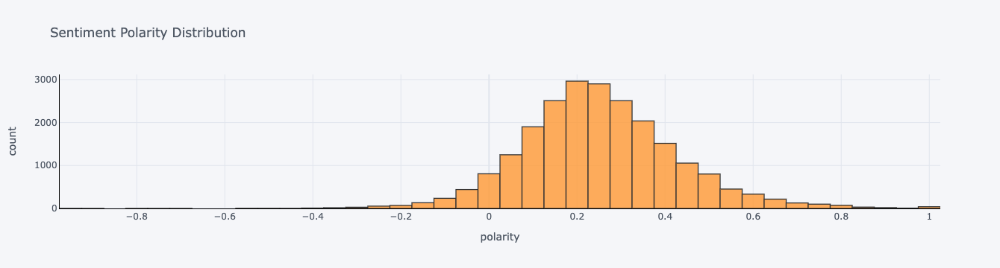

In [8]:
df['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

### Let us look how the sentiment polarity relates to the given rating:

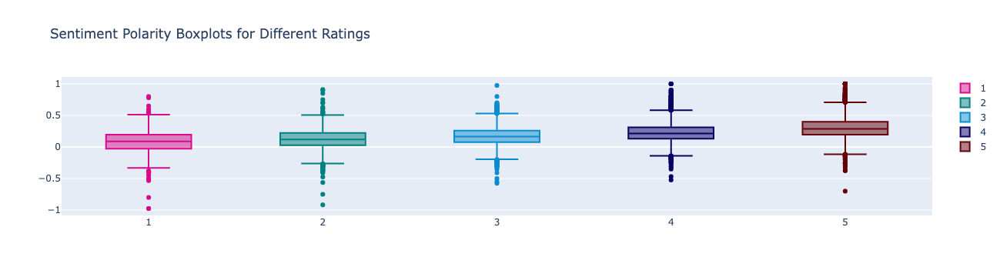

In [9]:
y0 = df.loc[df['Rating'] == 1]['polarity']
y1 = df.loc[df['Rating'] == 2]['polarity']
y2 = df.loc[df['Rating'] == 3]['polarity']
y3 = df.loc[df['Rating'] == 4]['polarity']
y4 = df.loc[df['Rating'] == 5]['polarity']

trace0 = go.Box(
    y=y0,
    name = '1',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = '2',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = '3',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = '4',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace4 = go.Box(
    y=y4,
    name = '5',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(
    title = "Sentiment Polarity Boxplots for Different Ratings"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Sentiment Polarity Boxplots for Different Ratings")

### How does the sentiment polarity of the reviews relate to the use of positive and negative words?
To see how the computed sentiment polarity values relate to the use of specific words, we create lists of positive and negative words from the words that can be seen in the word clouds. Thene take subsets of the reviews that include negative and positive words and compare the distributions of the sentiment polarity values in these subsets. Please note that these subsets, most probably, overlap, because positive and negative words may occur in the same review. Nevertheless, some differences in the distributions can be expected. 
<br>The distributions can be compared using frequency histograms. However, since there are much fewer reviews with negative words than those with positive words, the bars in the “negative” histogram will be much shorter than in the “positive” histogram, which complicates the comparison. Therefore, it is better to compare the distributions by creating two box plots.

Number of reviews using positive words:  19824
Number of reviews using negative words:  2414


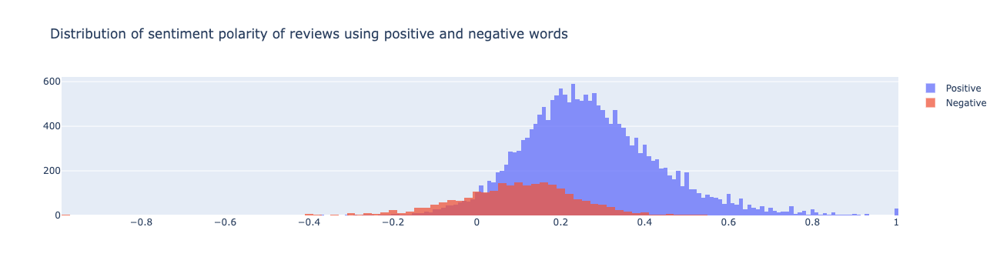

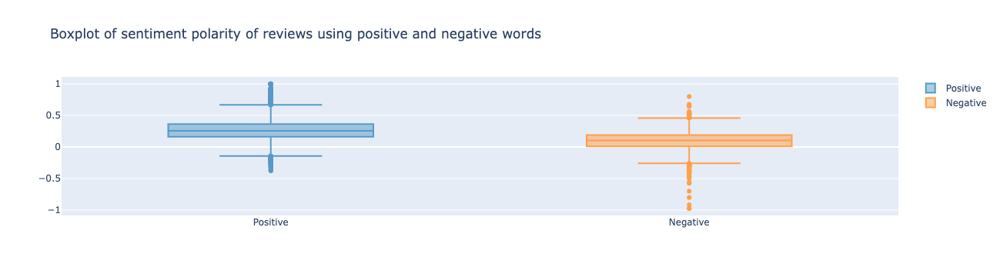

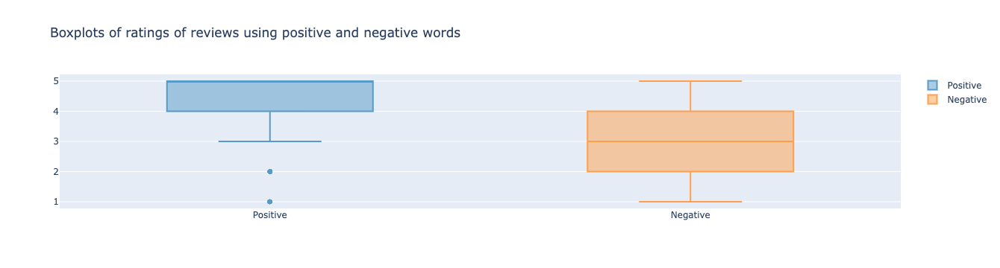

In [10]:
positive_words=['love','good','great','perfect','compliment','comfortable','beautiful','wonderful',
                         'excellent',  'nice','cute','pretty','cozy','super','pleasant']
negative_words=['bad', 'poor', 'terrible', 'disappoint', 'unfortunate', 'sad']

df_pos=df[df['Review Text'].str.contains('|'.join(positive_words),case=False)]
print("Number of reviews using positive words: ",len(df_pos))
df_neg=df[df['Review Text'].str.contains('|'.join(negative_words),case=False)]
print("Number of reviews using negative words: ",len(df_neg))

x0 = df_pos['polarity']
x1 = df_neg['polarity']

trace1 = go.Histogram(
    x=x0, name='Positive',
    opacity=0.75
)
trace2 = go.Histogram(
    x=x1, name = 'Negative',
    opacity=0.75
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', 
                   title='Distribution of sentiment polarity of reviews using positive and negative words')
fig = go.Figure(data=data, layout=layout)

iplot(fig, filename='overlaid histogram')

trace3 = go.Box(
    y=x0,
    name = 'Positive',
    marker = dict(
        color = 'rgb(87,153,199)',
    )
)
trace4 = go.Box(
    y=x1,
    name = 'Negative',
    marker = dict(
        color = 'rgb(255,159,74)',
    )
)
data = [trace3, trace4]
layout = go.Layout(
    title = "Boxplot of sentiment polarity of reviews using positive and negative words"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Boxplot of sentiment polarity of reviews using positive and negative words")

x0 = df_pos['Rating']
x1 = df_neg['Rating']

trace3 = go.Box(
    y=x0,
    name = 'Positive',
    marker = dict(
        color = 'rgb(87,153,199)',
    )
)
trace4 = go.Box(
    y=x1,
    name = 'Negative',
    marker = dict(
        color = 'rgb(255,159,74)',
    )
)
data = [trace3, trace4]
layout = go.Layout(
    title = "Boxplots of ratings of reviews using positive and negative words"
)

fig = go.Figure(data=data,layout=layout)

iplot(fig, filename = "Boxplots of ratings of reviews using positive and negative words")


## Exploration of the texts by extracting frequent words and combinations

A word cloud represents word frequencies by font sizes, but it is hardly possible to determine and compare these frequencies using this display alone. Another way of text summarization, which gives you exact values and enables comparisons, is extraction of <b><i>k</b></i> most frequent words, where <b><i>k</b></i> is some chosen number (e.g., 25). The same can be done for combinations of 2, 3, …, words, which are called bigrams, trigrams, and, more generally, <b><i>n</b></i>-grams, where <b><i>n</b></i> is some number. Extracted words or combinations and their frequencies can be visualised, for example, by bar charts.

<br>Let us first see what individual words are the most frequent in the review texts:

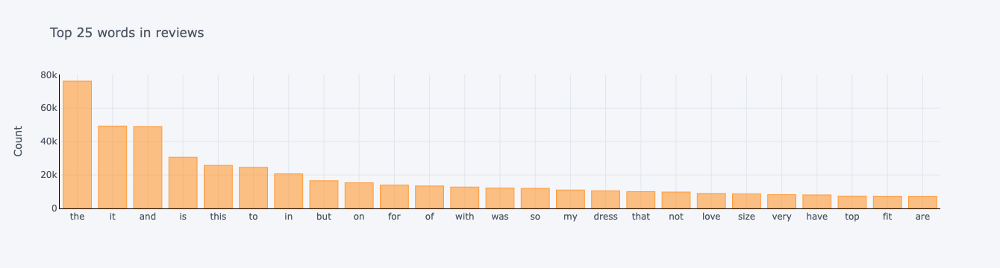

In [11]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer().fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['Review Text'], 25)
df1 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df1.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in reviews')

As could be expected, the most frequent words are articles, pronouns, conjunctions, prepositions, and other non-informative words, which are called "stop words". Such words should be removed from the texts before doing further analysis. Please note that the WordCloud library includes its own default list of stop words and removes those words from the text before generating the display.
<br>In the following, we modify the function that extracts the most frequent words so that it will remove stop words using the internal list of stop words of the package <i>sklearn</i>.

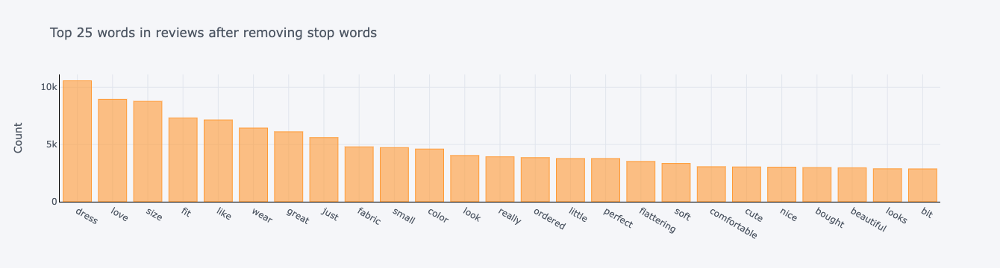

In [12]:
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]
common_words = get_top_n_words(df['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in reviews after removing stop words')

### Extraction and exploration of frequent n-grams
Let us also see the most frequent bigrams and trigrams, i.e., combinations with two and three words. 
More generally, it is possible to extract combinations with n words, which are called n-grams. 

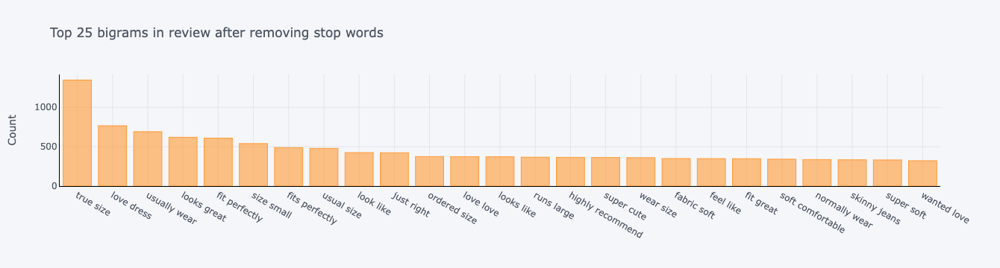

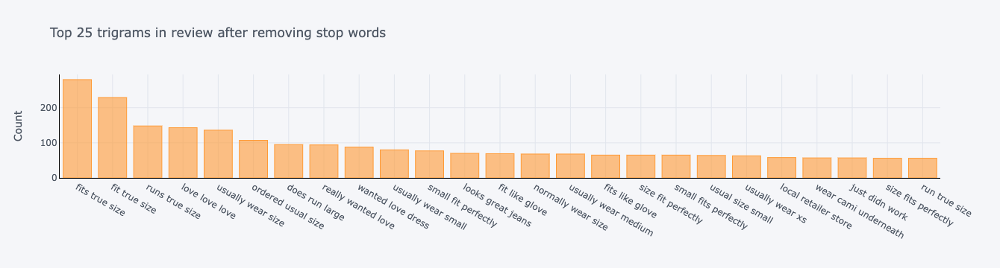

In [13]:
def get_top_k_n_gram(corpus, k=None, n=None):
    vec = CountVectorizer(ngram_range=(n, n), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:k]
common_bigrams = get_top_k_n_gram(df['Review Text'], 25,2)
df3 = pd.DataFrame(common_bigrams, columns = ['ReviewText' , 'count'])
df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in review after removing stop words')
common_trigrams = get_top_k_n_gram(df['Review Text'], 25,3)
df3 = pd.DataFrame(common_trigrams, columns = ['ReviewText' , 'count'])
df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 trigrams in review after removing stop words')

### What disappoints people and what makes them happy?
Let us compare the most frequent words and bigrams in the reviews with high and low ratings.

Number of reviews with low ratings:  2370


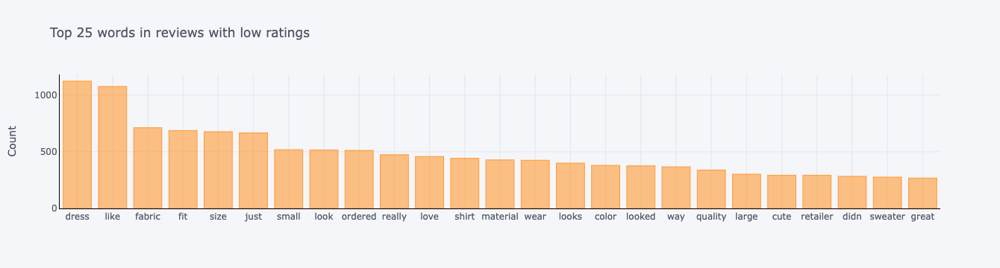

Number of reviews with high ratings:  17448


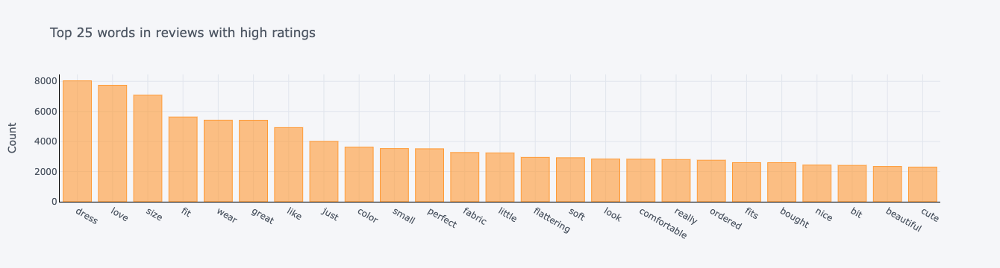

In [14]:
df_selection=df[df['Rating']<3]
print("Number of reviews with low ratings: ",len(df_selection))

common_words = get_top_n_words(df_selection['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in reviews with low ratings')

df_selection=df[df['Rating']>3]
print("Number of reviews with high ratings: ",len(df_selection))

common_words = get_top_n_words(df_selection['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in reviews with high ratings')


### Extracting and comparing frequent bigrams (or other n-grams) frm reviews with low and high ratings
You can modify the code to extract and compare frequent trigrams or other n-grams. For this purpose, change the value of the second parameter in the call <i>get_top_k_n_gram(df_selection['Review Text'], 25,2)</i>.

Number of reviews with low ratings:  2370


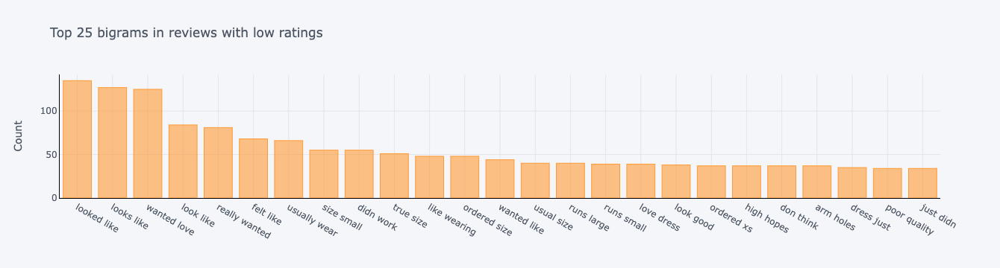

Number of reviews with high ratings:  17448


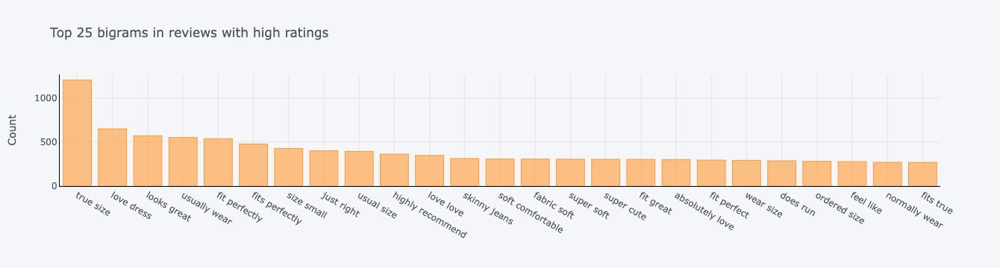

In [15]:
df_selection=df[df['Rating']<3]
print("Number of reviews with low ratings: ",len(df_selection))

common_bigrams_selection = get_top_k_n_gram(df_selection['Review Text'], 25,2)
df4 = pd.DataFrame(common_bigrams_selection, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in reviews with low ratings')

df_selection=df[df['Rating']>3]
print("Number of reviews with high ratings: ",len(df_selection))

common_bigrams_selection = get_top_k_n_gram(df_selection['Review Text'], 25,2)
df4 = pd.DataFrame(common_bigrams_selection, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in reviews with high ratings')

## Exploring texts concerning different features of the clothes
Let us now investigate the customers' opinions concerning some features of the clothes, such as size, quality, color, fabric, etc. For this purpose, we select the reviews containing particular substrings. We shall look at the sentiment polarity statistics in comparison to the statistics for the whole dataset. Then we shall look at the most frequent bigrams.
<br>In the following code, we introduce a variable <i>feature_of_interest</i>, whose value is a string used for filtering of the dataset and selecting the texts where particular features are mentioned. Change the value nof this variable to explore the texts concerning other features.

Number of reviews containing the given substring:  6969


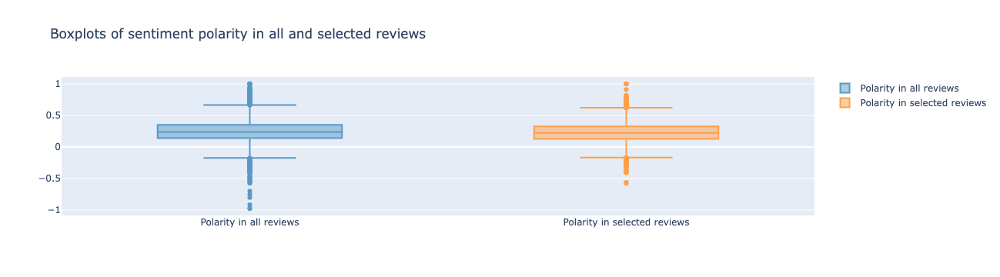

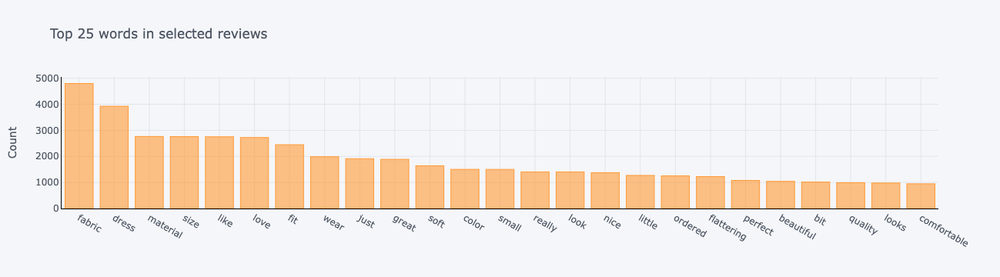

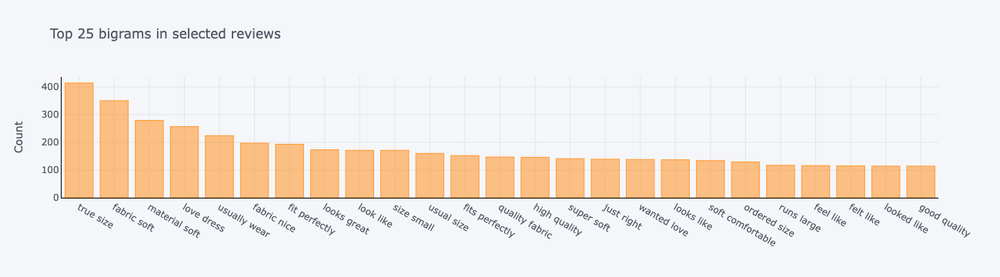

In [16]:
features_of_interest=["fabric", "material","cloth","textile"]
#features_of_interest=["design", "style","color"]
#features_of_interest=["quality"]
#features_of_interest=["size", "fit"]

feature_of_interest="|".join(element for element in features_of_interest)

## another way to make a string for filtering:
#feature_of_interest="size|fit"
#feature_of_interest="quality"
#feature_of_interest="fabric|material|cloth|textile"
#feature_of_interest="design|style"

df_selection=df[df['Review Text'].str.contains(feature_of_interest,case=False)]

print("Number of reviews containing the given substring: ",len(df_selection))

x0 = df['polarity']
x1 = df_selection['polarity']

trace1 = go.Box(
    y=x0,
    name = 'Polarity in all reviews',
    marker = dict(
        color = 'rgb(87,153,199)',
    )
)
trace2 = go.Box(
    y=x1,
    name = 'Polarity in selected reviews',
    marker = dict(
        color = 'rgb(255,159,74)',
    )
)
data = [trace1, trace2]
layout = go.Layout(
    title = "Boxplots of sentiment polarity in all and selected reviews"
)

fig = go.Figure(data=data,layout=layout)
iplot(fig, filename = "Boxplots of sentiment polarity in all and selected reviews")

common_words = get_top_n_words(df_selection['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in selected reviews')

common_bigrams = get_top_k_n_gram(df_selection['Review Text'], 25,2)
df3 = pd.DataFrame(common_bigrams, columns = ['ReviewText' , 'count'])
df3.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in selected reviews')

Let us see what makes people happy and unhappy in relation to the selected feature. 
<br><b>Please note</b> that the following cells use the result of the previous cell, namely, the selection of the data records concerning a chosen feature. If you want to investigate another feature, you need to <b>re-run the previous cell and the following cells</b>.

Number of reviews with low ratings:  956
Number of reviews with high ratings:  4909


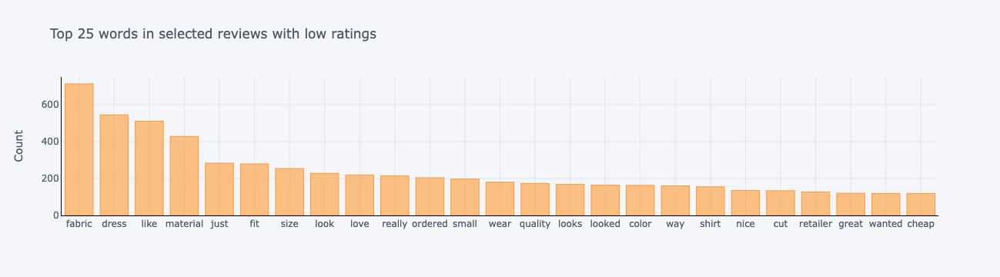

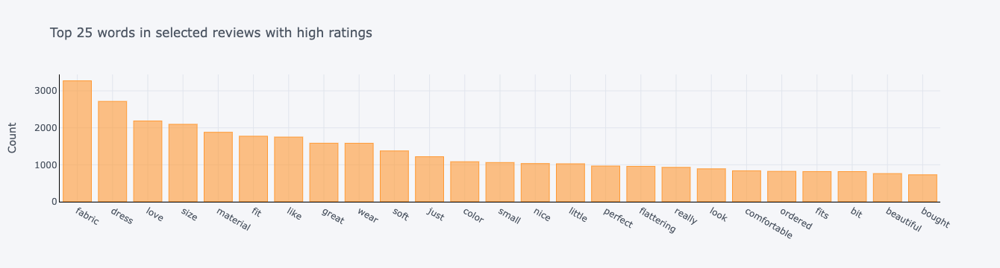

In [17]:
df_low=df_selection[df_selection['Rating']<3]
print("Number of reviews with low ratings: ",len(df_low))

df_high=df_selection[df_selection['Rating']>3]
print("Number of reviews with high ratings: ",len(df_high))

common_words = get_top_n_words(df_low['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in selected reviews with low ratings')

common_words = get_top_n_words(df_high['Review Text'], 25)
df2 = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
df2.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 words in selected reviews with high ratings')

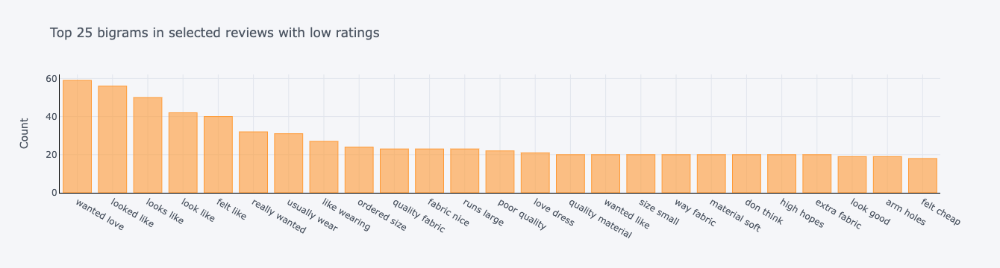

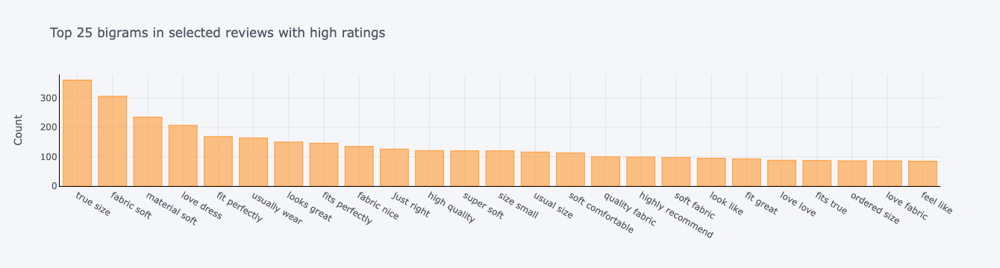

In [18]:
common_bigrams_selection = get_top_k_n_gram(df_low['Review Text'], 25,2)
df4 = pd.DataFrame(common_bigrams_selection, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in selected reviews with low ratings')

common_bigrams_selection = get_top_k_n_gram(df_high['Review Text'], 25,2)
df4 = pd.DataFrame(common_bigrams_selection, columns = ['ReviewText' , 'count'])
df4.groupby('ReviewText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 25 bigrams in selected reviews with high ratings')

The reviews can also be compared using word clouds.

Negative reviews concerning feature(s) < ['fabric', 'material', 'cloth', 'textile'] >


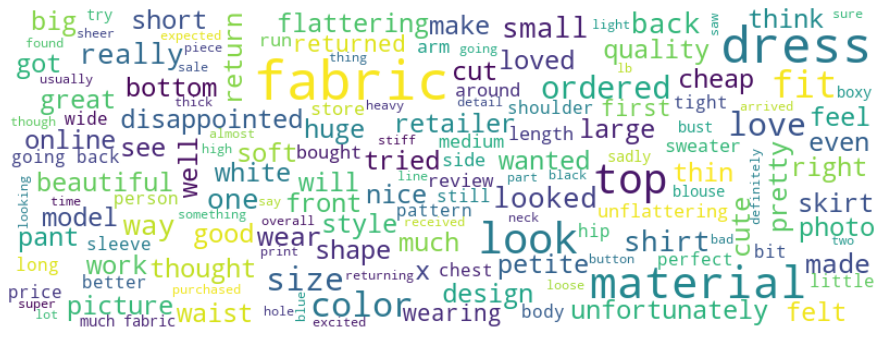

Positive reviews concerning feature(s) < ['fabric', 'material', 'cloth', 'textile'] >


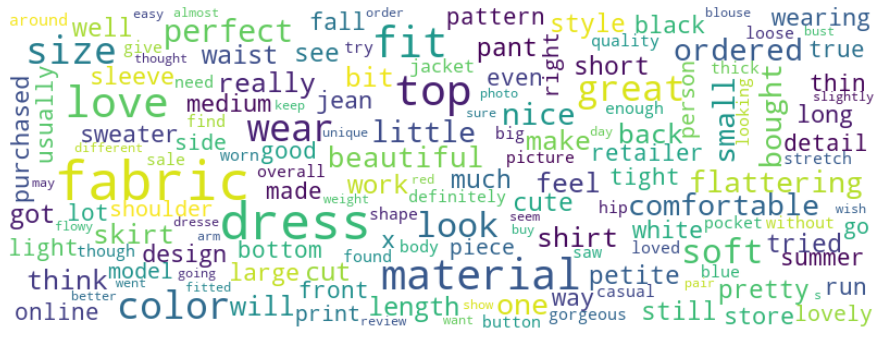

In [19]:
text = " ".join(review for review in df_low['Review Text']) 

wordcloud1 = WordCloud(max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

text = " ".join(review for review in df_high['Review Text']) 

wordcloud2 = WordCloud(max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud1, interpolation='bilinear')
_ = plt.axis("off")
print("Negative reviews concerning feature(s) <",features_of_interest,">")
plt.show()

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud2, interpolation='bilinear')
_ = plt.axis("off")
print("Positive reviews concerning feature(s) <",features_of_interest,">")
plt.show()


Below is an example of modifying the list of the stop words used in the WordCloud.

Negative reviews concerning feature(s) < ['fabric', 'material', 'cloth', 'textile'] >


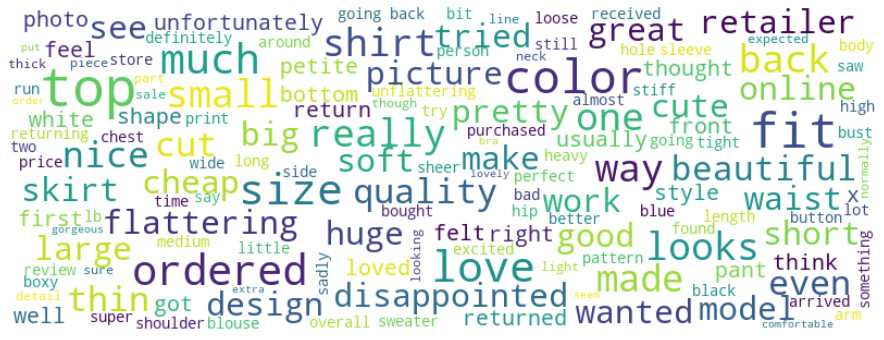

Positive reviews concerning feature(s) < ['fabric', 'material', 'cloth', 'textile'] >


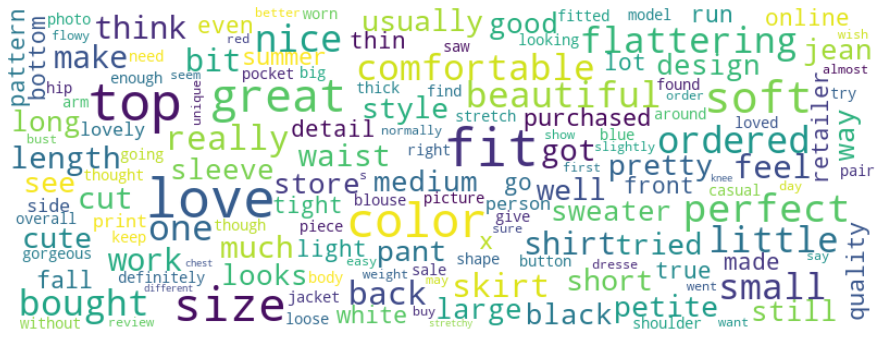

In [20]:
stopwords = set(STOPWORDS)
stopwords.update(["dress", "wear", "wearing", "thing", "look", "looked", "will"])
stopwords.update(features_of_interest)

text = " ".join(review for review in df_low['Review Text']) 
wordcloud1 = WordCloud(stopwords=stopwords,
                       max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

text = " ".join(review for review in df_high['Review Text']) 
wordcloud2 = WordCloud(stopwords=stopwords, 
                       max_font_size=50, min_font_size=8, max_words=150, background_color="white",
                     width=800, height=300, prefer_horizontal=0.99).generate(text)

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud1, interpolation='bilinear')
_ = plt.axis("off")
print("Negative reviews concerning feature(s) <",features_of_interest,">")
plt.show()

_ = plt.figure(figsize = (16, 6))
_ = plt.imshow(wordcloud2, interpolation='bilinear')
_ = plt.axis("off")
print("Positive reviews concerning feature(s) <",features_of_interest,">")
plt.show()


# Proposed next steps
This notebook includes the code necessary for fulfilling all tasks of the exercise. You can modify and/or extend this code to practice more in text analysis. Potentially interesting additional actions are:
- Test the impact of the parameter relative_scaling in building the word cloud. The parameter takes the values between 0 and 1. When it is 0, only word ranks are considered, and when it is 1, only word frequencies. Intermediate values make the algorithm account for both the ranks and the frequencies giving different weights to them. To obtain the list of parameters of WordCloud and explanations of their meanings, use the command ?WordCloud.
- In the analysis steps involving the use of WordCloud, extend the list of the stop words used by the WordCloud tool with the highly frequent words from the reviews. Since these words are very frequent, they are not very informative. See how the modification of the list of stop words affects the result of the WordCloud algorithm. An example of a code is included at the end of the notebook. 
 - Find out on your own how the same can be done for <i>CountVectorizer</i> in package <i>sklearn</i>, which is used for the extraction of frequent words and n-grams.
- Analyse the texts of the review titles similarly to the analysis of the review texts. Since the titles are often concise summaries of the reviews, the analysis may give you additional understanding of what is the most important for people.
